## Read and Inspect the Shapefile

In [1]:
import geopandas as gpd

# Read the shapefile
gdf = gpd.read_file('./world-administrative-boundaries.shp')

# Print the first few rows to inspect the data
gdf.head()

,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry
0,UGA,Member State,UGA,Uganda,Africa,Eastern Africa,UG,Ouganda,"POLYGON ((33.9211 -1.00194, 33.92027 -1.00111,..."
1,UZB,Member State,UZB,Uzbekistan,Asia,Central Asia,UZ,Ouzbékistan,"POLYGON ((70.97081 42.25467, 70.98054 42.26205..."
2,IRL,Member State,IRL,Ireland,Europe,Northern Europe,IE,Irlande,"MULTIPOLYGON (((-9.97014 54.02083, -9.93833 53..."
3,ERI,Member State,ERI,Eritrea,Africa,Eastern Africa,ER,Érythrée,"MULTIPOLYGON (((40.13583 15.7525, 40.12861 15...."
4,None,UK Territory,GBR,South Georgia & the South Sandwich Islands,Antarctica,None,None,South Georgia & the South Sandwich Islands,"MULTIPOLYGON (((-26.24361 -58.49473, -26.24889..."


## Geometric Operations
#### Buffering: Create a buffer around the country geometries.

/var/folders/nb/_ds8s7md66d60spt38yx81dr0000gn/T/ipykernel_43187/2963930805.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['geometry_buffer1'] = gdf['geometry'].buffer(1.0)


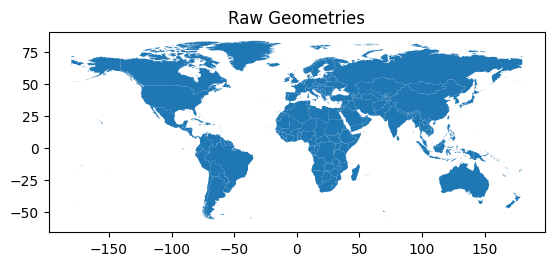

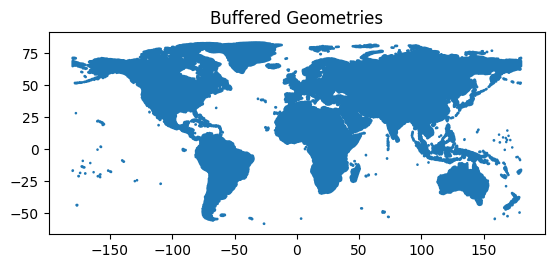

In [2]:
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Adding a buffer of 1 degree around each country's geometry
gdf['geometry_buffer1'] = gdf['geometry'].buffer(1.0)

# Plot the buffered geometries
gdf['geometry'].plot()
plt.title('Raw Geometries')
plt.show()
gdf['geometry_buffer1'].plot()
plt.title('Buffered Geometries')
plt.show()


## Union and Intersection
#### Perform geometric operations like union and intersection.

/var/folders/nb/_ds8s7md66d60spt38yx81dr0000gn/T/ipykernel_43187/1518906273.py:2: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  all_countries_union = gdf.unary_union


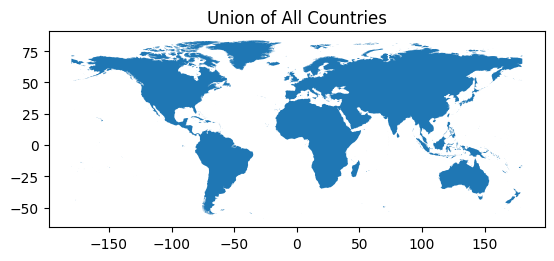

In [3]:
# Union of all geometries
all_countries_union = gdf.unary_union

# Plot the union result
gpd.GeoSeries([all_countries_union]).plot()
plt.title('Union of All Countries')
plt.show()


## Coordinate Systems and Projections
#### Transform the coordinate system of the geometries.

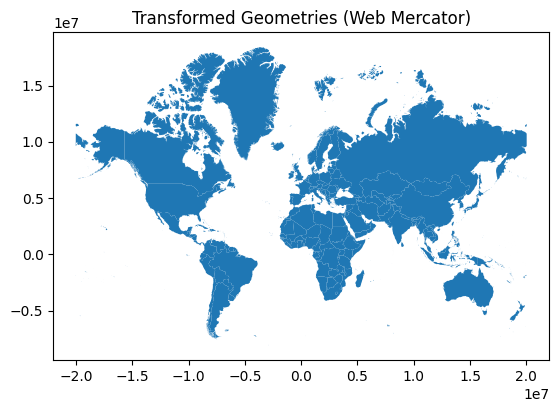

In [4]:
from pyproj import Transformer

# Define a transformer to convert from WGS84 (EPSG:4326) to Web Mercator (EPSG:3857)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")

# Apply the transformation
gdf = gdf.to_crs(epsg=3857)

# Plot the transformed geometries
gdf.plot()
plt.title('Transformed Geometries (Web Mercator)')
plt.show()


## Spatial Analysis
#### Perform a spatial join to analyze spatial relationships between geometries.

In [5]:
# Creating a new GeoDataFrame with random points for demonstration
points = gpd.GeoDataFrame({
    'geometry': [Point(x, y) for x, y in [(-100, 40), (-50, 30), (0, 0), (50, 50), (100, 60)]]
}, crs="EPSG:4326")

# Transform the points to the same CRS as the countries GeoDataFrame
points = points.to_crs(epsg=3857)

# Spatial join: find which points are within which country
joined = gpd.sjoin(points, gdf, how='inner', predicate='within')

# Print the result of the spatial join
print(joined)


                           geometry  index_right iso3        status  \
0  POINT (-11131949.079 4865942.28)           21  USA  Member State   
3    POINT (5565974.54 6446275.841)           31  KAZ  Member State   
4   POINT (11131949.079 8399737.89)          138  RUS  Member State   

  color_code                      name continent            region  \
0        USA  United States of America  Americas  Northern America   
3        KAZ                Kazakhstan      Asia      Central Asia   
4        RUS        Russian Federation    Europe    Eastern Europe   

  iso_3166_1_            french_shor  \
0          US  États-Unis d'Amérique   
3          KZ             Kazakhstan   
4          RU   Fédération de Russie   

                                    geometry_buffer1  
0  MULTIPOLYGON (((176.69751 51.03884, 176.69559 ...  
3  POLYGON ((45.80924 49.24608, 45.80634 49.27042...  
4  MULTIPOLYGON (((26.47822 58.44969, 26.46403 58...  


## Visualization
#### Visualize the spatial data using matplotlib.

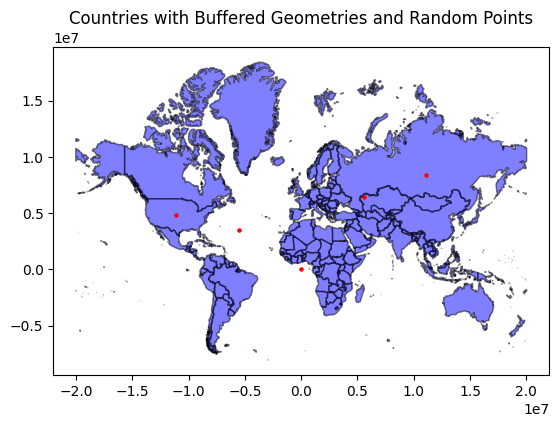

In [6]:
import matplotlib.pyplot as plt

# Plot the countries with buffered geometries and the points
fig, ax = plt.subplots()

# Plot countries
gdf.plot(ax=ax, color='blue', edgecolor='black', alpha=0.5)

# Plot points
points.plot(ax=ax, color='red', markersize=5)

plt.title('Countries with Buffered Geometries and Random Points')
plt.show()


In [36]:
import folium

# Create a basic map centered around New Zealand's latitude and longitude
m = folium.Map(location=[-36, 174], zoom_start=5)

# Add the countries shapefile to the map
folium.GeoJson(gdf['geometry']).add_to(m)

# Save the map to an HTML file and display it
m.save('map.html')
m

In [37]:
# Create a point for Auckland location and add to the map
points = gpd.GeoDataFrame({
    'geometry': [Point(x, y) for x, y in [(175, -37)]]
}, crs="EPSG:4326" )

# Add the point to the Folium map
for _, row in points.iterrows():
    folium.Marker([row.geometry.y, row.geometry.x], icon=folium.Icon(color='red'),
        tooltip='Auckland').add_to(m)

# Save and display the map
m.save('map_with_AUcklandPoint_tooltip.html')
m